In [1]:
!date

Fri Mar  6 17:30:08 PST 2020


# Subclass labels location merfish

In [2]:
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches
import scanpy as scanp
from scipy.stats import ks_2samp, ttest_ind
from scipy.sparse import csr_matrix
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NeighborhoodComponentsAnalysis
from matplotlib import cm
from scipy.spatial import ConvexHull
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import normalize

import warnings
warnings.filterwarnings('ignore')

fsize=20

plt.rcParams.update({'font.size': fsize})
%config InlineBackend.figure_format = 'retina'

In [3]:
mfish = anndata.read_h5ad("../cell_ranger_annotation/merfish.h5ad")

Transforming to str index.


In [4]:
mfish

AnnData object with n_obs × n_vars = 243799 × 254 
    obs: 'label', 'subclass', 'sampleID', 'sliceID', 'label_v1', 'AP_distance (um)', 'pos_x (um)', 'pos_y (um)', 'cell_id'
    var: 'n_iso'
    layers: 'X', 'log1p', 'norm'

In [19]:
mfish.obs.subclass.unique()

[Sst, Endothelial, L6_IT, L2/3_IT, VLMC, ..., striatum, L6b, Macrophages, Sst_Chodl, Ependymal]
Length: 26
Categories (26, object): [Sst, Endothelial, L6_IT, L2/3_IT, ..., L6b, Macrophages, Sst_Chodl, Ependymal]

In [77]:
cluster_cmap = {
"Astro": (0.38823529411764707, 0.4745098039215686,  0.2235294117647059 ),  # 637939,
"Endo" : (0.5490196078431373,  0.6352941176470588,  0.3215686274509804 ),  # 8ca252,
"SMC"  : (0.7098039215686275,  0.8117647058823529,  0.4196078431372549 ),  # b5cf6b,
"VLMC" : (0.807843137254902,   0.8588235294117647,  0.611764705882353  ),  # cedb9c,
"Low Quality" : (0,0,0),
"L2/3 IT" : (0.9921568627450981,  0.6823529411764706,  0.4196078431372549  ),  # fdae6b
"L5 PT" : (0.9921568627450981,  0.8156862745098039,  0.6352941176470588  ),  # fdd0a2
"L5 IT" : (0.5176470588235295,  0.23529411764705882, 0.2235294117647059 ),  # 843c39
"L5/6 NP": "#D43F3A",
"L6 CT" : (0.8392156862745098,  0.3803921568627451,  0.4196078431372549 ),  # d6616b
"L6 IT" : (0.9058823529411765,  0.5882352941176471,  0.611764705882353  ),  # e7969c
"L6b" : (1.0,                 0.4980392156862745,  0.054901960784313725),  # ff7f0e
"L6 IT Car3" : (1.0,                 0.7333333333333333,  0.47058823529411764 ),  # ffbb78
"Lamp5" : (0.19215686274509805, 0.5098039215686274,  0.7411764705882353  ),  # 3182bd # blues
"Sncg" : (0.4196078431372549,  0.6823529411764706,  0.8392156862745098  ),  # 6baed6
"Vip" : (0.6196078431372549,  0.792156862745098,   0.8823529411764706  ),  # 9ecae1
"Sst" : (0.7764705882352941,  0.8588235294117647,  0.9372549019607843  ),  # c6dbef
"Pvalb":(0.7372549019607844,  0.7411764705882353,  0.8627450980392157  ),  # bcbddc
"Ependymal":     (0.596078431372549,   0.8745098039215686,  0.5411764705882353  ),  # 98df8a
"L4/5_IT": "#846239",
"Macrophages": (0.6196078431372549,  0.6039215686274509,  0.7843137254901961  ),  # 9e9ac8
"Microglia":     (0.17254901960784313, 0.6274509803921569,  0.17254901960784313 ),  # 2ca02c,
"OPC": (0.7372549019607844,  0.7411764705882353,  0.8627450980392157  ),  # bcbddc
"Oligodendrocytes": (0.8549019607843137,  0.8549019607843137,  0.9215686274509803  ) , # dadaeb
"Pericytes": "pink",
"Sst_Chodl": "#c6efef",
"striatum": "grey"
}



In [7]:
le = LabelEncoder()
mfish.obs["subclass_id"] = le.fit_transform(mfish.obs.subclass.values)

In [9]:
def trim_axs(axs, N):
    """little helper to massage the axs list to have correct length..."""
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

In [11]:
sliceID = mfish.obs.sliceID.values
sliceID = np.unique(sliceID)

In [13]:
gb = mfish.obs.groupby("sliceID")["pos_x (um)", "pos_y (um)"]

In [28]:
mfish.obs["AP_distance (um)"].unique().shape

(60,)

In [30]:
unique_map = {
"L5_IT" : "L5 IT",
"L6_CT" : "L6 CT",
"L6b" : "L6b",
"Vip" : "Vip",
"Pvalb" : "Pvalb",
"L2/3_IT" : "L2/3 IT",
"L6_IT" : "L6 IT",
"Sst" : "Sst",
"Lamp5" : "Lamp5",
"L56_NP" : "L5/6 NP",
"Sncg" : "Sncg",
"SMC" : "SMC",
"L5_PT" : "L5 PT", # Check
"Endothelial" : "Endo",
"Astrocytes" : "Astro",
"VLMC" : "VLMC",
"L6_IT_Car3" : "L6 IT Car3"}

inv_map = {v: k for k, v in unique_map.items()}

In [32]:
mfish.obs.subclass = mfish.obs.subclass.apply(lambda x: unique_map.get(x,x))

In [33]:
unique_subclass = np.unique(mfish.obs.subclass)

In [35]:
mfish.obs.subclass == 

0             Sst
1            Endo
2           L6 IT
3         L2/3 IT
4            VLMC
           ...   
243794      L5 IT
243795    L2/3 IT
243796      L6 CT
243797       Endo
243798      L6 IT
Name: subclass, Length: 243799, dtype: category
Categories (26, object): [Astro, Endo, Ependymal, L2/3 IT, ..., Sst_Chodl, VLMC, Vip, striatum]

In [61]:
unique_subclass

array(['Astro', 'Endo', 'Ependymal', 'L2/3 IT', 'L4/5_IT', 'L5 IT',
       'L5 PT', 'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5',
       'Macrophages', 'Microglia', 'OPC', 'Oligodendrocytes', 'Pericytes',
       'Pvalb', 'SMC', 'Sncg', 'Sst', 'Sst_Chodl', 'VLMC', 'Vip',
       'striatum'], dtype=object)

In [86]:
list(cluster_cmap.keys())

['Astro',
 'Endo',
 'SMC',
 'VLMC',
 'Low Quality',
 'L2/3 IT',
 'L5 PT',
 'L5 IT',
 'L5/6 NP',
 'L6 CT',
 'L6 IT',
 'L6b',
 'L6 IT Car3',
 'Lamp5',
 'Sncg',
 'Vip',
 'Sst',
 'Pvalb',
 'Ependymal',
 'L4/5_IT',
 'Macrophages',
 'Microglia',
 'OPC',
 'Oligodendrocytes',
 'Pericytes',
 'Sst_Chodl',
 'striatum']

In [53]:
unique_map.get(cluster)

'L6b'

In [57]:
cluster

'striatum'

In [98]:
cluster_order = [
    "Lamp5",
    "Sncg",
    "Vip",
    "Sst",
    "Sst_Chodl",
    "Pvalb",
    "L5 IT",
    "L5/6 NP",
    "L5 PT",
    "L4/5_IT",
    "L2/3 IT",
    "L6b",
    "VLMC",
    "L6 IT",
    "L6 CT",
    "L6 IT Car3",
    "Endo",
    "Astro",
    "SMC",
    "Ependymal",
    "OPC",
    "Oligodendrocytes",
    "Macrophages",
    "Microglia",
    "Pericytes",
    "striatum"
]

In [84]:
len(cluster_order)

24

In [115]:
 mfish.obs.subclass.value_counts()[cluster_order]

Lamp5                3095
Sncg                  477
Vip                  2789
Sst                  4853
Sst_Chodl             232
Pvalb                7885
L5 IT               14685
L5/6 NP              3482
L5 PT                6759
L4/5_IT             29147
L2/3 IT             33757
L6b                  3487
VLMC                 6173
L6 IT               12475
L6 CT               23878
L6 IT Car3           1563
Endo                18183
Astro               19230
SMC                  3785
Ependymal              32
OPC                  4906
Oligodendrocytes    19472
Macrophages          5133
Microglia            8554
Pericytes            6553
striatum             3214
Name: subclass, dtype: int64

In [140]:
mfish.obs.subclass.value_counts()[cluster_order].apply(lambda x: "{:,}".format(x))

Lamp5                3,095
Sncg                   477
Vip                  2,789
Sst                  4,853
Sst_Chodl              232
Pvalb                7,885
L5 IT               14,685
L5/6 NP              3,482
L5 PT                6,759
L4/5_IT             29,147
L2/3 IT             33,757
L6b                  3,487
VLMC                 6,173
L6 IT               12,475
L6 CT               23,878
L6 IT Car3           1,563
Endo                18,183
Astro               19,230
SMC                  3,785
Ependymal               32
OPC                  4,906
Oligodendrocytes    19,472
Macrophages          5,133
Microglia            8,554
Pericytes            6,553
striatum             3,214
Name: subclass, dtype: object

In [145]:
labels = (pd.Series(cluster_order) + ": " + mfish.obs.subclass.value_counts()[cluster_order].apply(lambda x: "{:,}".format(x)).values.astype(str)).values

In [146]:
labels

array(['Lamp5: 3,095', 'Sncg: 477', 'Vip: 2,789', 'Sst: 4,853',
       'Sst_Chodl: 232', 'Pvalb: 7,885', 'L5 IT: 14,685',
       'L5/6 NP: 3,482', 'L5 PT: 6,759', 'L4/5_IT: 29,147',
       'L2/3 IT: 33,757', 'L6b: 3,487', 'VLMC: 6,173', 'L6 IT: 12,475',
       'L6 CT: 23,878', 'L6 IT Car3: 1,563', 'Endo: 18,183',
       'Astro: 19,230', 'SMC: 3,785', 'Ependymal: 32', 'OPC: 4,906',
       'Oligodendrocytes: 19,472', 'Macrophages: 5,133',
       'Microglia: 8,554', 'Pericytes: 6,553', 'striatum: 3,214'],
      dtype=object)

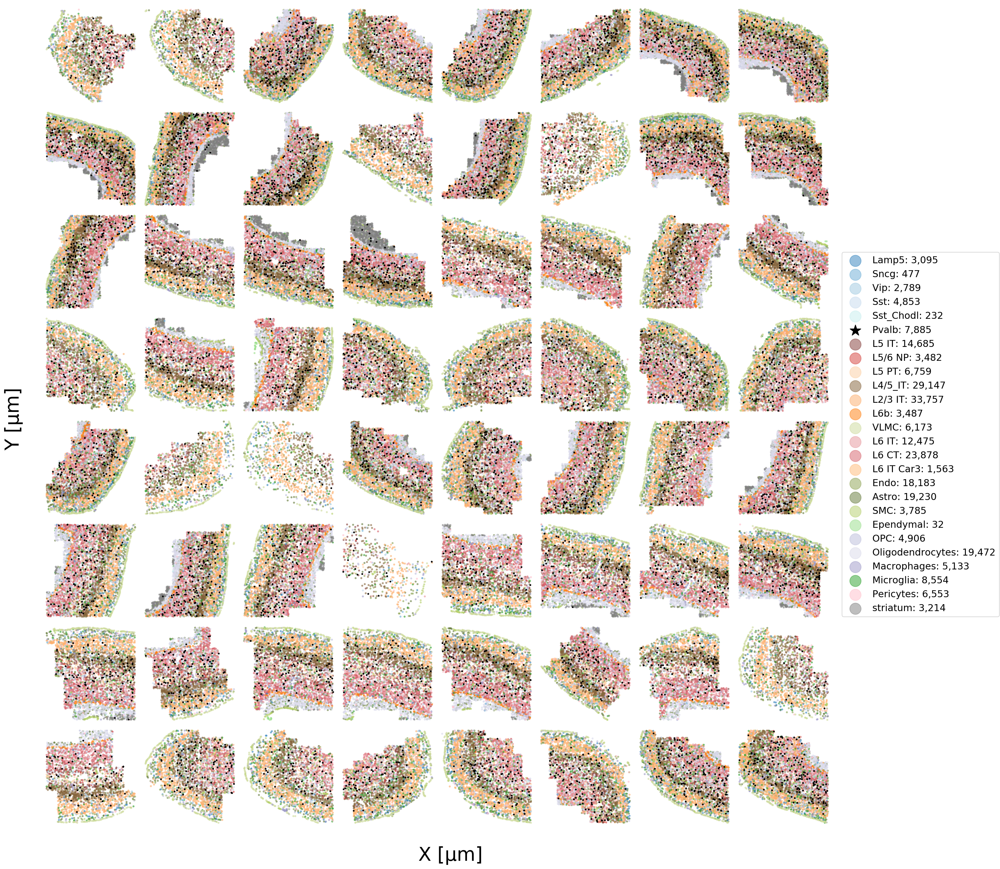

CPU times: user 58.3 s, sys: 10.7 s, total: 1min 8s
Wall time: 48.5 s


In [167]:
%%time
fig, ax = plt.subplots(figsize=(24,24), ncols=8, nrows=8)
fig.subplots_adjust(hspace=0, wspace=0)

axs = trim_axs(ax, len(sliceID))

for sidx, (ax, slice_name) in enumerate(zip(axs, sliceID)):
    s = gb.get_group(sliceID[sidx])
    
    X_mask = s.index.values.astype(int)
    
    x = mfish.obs["pos_x (um)"][X_mask]
    y = mfish.obs["pos_y (um)"][X_mask]
    
    ss_labels = mfish.obs.subclass[X_mask]
    
    #c = mfish.obs["subclass_id"].values[X_mask]
    
    for cidx, cluster in enumerate(unique_subclass):
        xx = x[ss_labels == cluster]
        yy = y[ss_labels == cluster]
        color=cluster_cmap.get(cluster, "black")
        
        markerstyle="o"
        s=5
        zorder=1
        edgecolor = "face"
        alpha=0.5
        if cluster == "Pvalb": markerstyle="*";zorder=10; alpha=1; color="k"; markerstyle="*"
        
        ax.scatter(xx, yy, color=color, label="{}: {:,}".format(cluster, xx.shape[0]), s=s, zorder=zorder, alpha=alpha, marker=markerstyle)
    
    
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.set_axis_off()


handles, _ = ax.get_legend_handles_labels()
idx = [np.where(unique_subclass==i)[0][0] for i in cluster_order]
handles = np.array(handles)[idx]


#plt.legend(handles, labels, loc="center left",  markerscale=8, bbox_to_anchor=(0.825, 0.5, ), fontsize=15, borderaxespad=0.)
fig.legend(handles, labels, markerscale=8, fontsize=15, loc="center right",borderaxespad=0.1)      # Title for the legend

# Adjust the scaling factor to fit your legend text completely outside the plot
# (smaller value results in more space being made for the legend)
plt.subplots_adjust(right=0.85)
    
fig.text(0.5, 0.1, 'X [µm]', ha='center', va='center', fontsize=30)
fig.text(0.1, 0.5, 'Y [µm]', ha='center', va='center', rotation='vertical', fontsize=30)
plt.savefig("./figures/merfish_subclass_locations.png", bbox_inches='tight',dpi=300)
plt.show()